In [2]:
import os
import sys
import time
import numpy as np
import pandas as pd
import gzip
import matplotlib.pyplot as plt
import umap
import glob
import PyPDF2 
from natsort import natsorted 


import matplotlib.cm as cm
import matplotlib.colors as mcolors
import matplotlib.font_manager as font_manager
from mpl_toolkits.axes_grid1 import make_axes_locatable
import seaborn as sns
import random
import math

from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import mutual_info_score
from scipy.stats import pearsonr
from matplotlib.colors import Normalize
from matplotlib import cm

/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/aabisheva/anaconda3/envs/nmf/lib/python3.11/site-packages/umap/d

In [3]:
import matplotlib as mpl
from scipy.cluster import hierarchy
from scipy.spatial import distance
from matplotlib.colors import ListedColormap

In [4]:
sys.path.append('/net/seq/data2/projects/aabisheva/Encode/my_ipynb/Vocabulary')
import OONMF
import OONMFhelpers
from OONMFhelpers import get_barsortorder

In [5]:
os.chdir("/net/seq/data2/projects/aabisheva/Encode/my_ipynb/")
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_style("white")

In [6]:
def make_stacked_bar_plot_sorted(self, Nrelevant, BarMatrix, bargraph_out, names=[], barsortorder=[], plot_title='', figdim1=150, figdim2=40):
    if len(barsortorder) < 1:
        barsortorder = np.arange(Nrelevant)

    if len(names) < 1:
        names = [str(i) for i in range(Nrelevant)]
        names = np.array(names)

    start = 0
    end = Nrelevant
    Xpositions = np.arange(Nrelevant)

    self.define_colors()

    plt.clf()
    plt.figure(figsize=(figdim1, figdim2))

    for column in range(Nrelevant):
        ground_pSample = 0
        bar_heights = BarMatrix[:, start:end].T[barsortorder][column]
        indices = np.flip(np.argsort(bar_heights))
        # indices = np.arange(self.Ncomps)
        sorted_heights = bar_heights[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.bar(Xpositions[column], sorted_heights[component], bottom=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(sorted_heights[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.ylabel('sum of signal in matrix', fontsize=70)
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / Nrelevant)**0.5 * 130
    thebottom = min([(1 / Nrelevant)**0.3 * 1.2, 0.3])

    plt.xticks(Xpositions, names[barsortorder], rotation='vertical', fontsize=samplenamesize)
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=thebottom)

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()


OONMF.NMFobject.make_stacked_bar_plot_sorted = make_stacked_bar_plot_sorted

In [7]:
def make_stacked_bar_plot_sorted_horisontal(self, Nrelevant, BarMatrix, bargraph_out, names=[], barsortorder=[], plot_title='', figdim1=150, figdim2=40):
    if len(barsortorder) < 1:
        barsortorder = np.arange(Nrelevant)

    if len(names) < 1:
        names = [str(i) for i in range(Nrelevant)]
        names = np.array(names)

    start = 0
    end = Nrelevant
    Ypositions = np.arange(Nrelevant)

    self.define_colors()

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))  # switched figdim1 and figdim2

    for row in range(Nrelevant):
        ground_pSample = 0
        bar_widths = BarMatrix[:, start:end].T[barsortorder][row]
        indices = np.flip(np.argsort(bar_widths))
        # indices = np.arange(self.Ncomps)
        sorted_widths = bar_widths[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[row], sorted_widths[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(sorted_widths[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / Nrelevant)**0.5 * 130
    thebottom = min([(1 / Nrelevant)**0.3 * 1.2, 0.3])

    plt.yticks(Ypositions, names[barsortorder], fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_sorted_horisontal = make_stacked_bar_plot_sorted_horisontal

In [8]:
def barsortorder_all_components(BarMatrix):
    bar_indices = np.empty(BarMatrix.T.shape)
    for i, bar in enumerate(BarMatrix):
        np.copyto(bar_indices[:, i], np.flip(np.argsort(bar)))
    return np.lexsort(np.flip(bar_indices, 0))

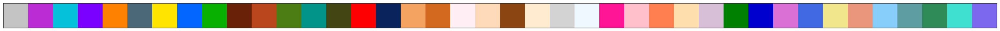

In [9]:
# Just color scheme inicialization

n_components = 40

# code from Waulter's library, to have the similar colors as in barplot
colors_order = ['#FFE500', '#FE8102', '#FF0000', '#07AF00', '#4C7D14', '#414613', '#05C1D9', '#0467FD', '#009588', '#BB2DD4', '#7A00FF', '#4A6876', '#08245B', '#B9461D', '#692108', '#C3C3C3']
neworder = np.array([16,10,7,11,2,12,1,8,4,15,14,5,9,6,3,13]).astype(int) - 1
colors_order = list(np.array(colors_order)[neworder])

if (n_components>len(colors_order)):
    colornames = np.sort(list(mcolors.CSS4_COLORS.keys()))
    count = len(colors_order)
    np.random.seed(10)
    myrandint = np.random.randint(len(colornames))
    while (count < n_components):
        myrandint =    np.random.randint(len(colornames))
        newcolor = colornames[myrandint]
        trialcount = 0
        while ((newcolor in colors_order) and (trialcount < 100)):
            newcolor = colornames[np.random.randint(0,len(colornames))]
            trialcount+=1
        #print('new color ',count,newcolor)
        colors_order.append(newcolor)
        count+=1

# just for checking colors
fig, ax = plt.subplots(figsize=(len(colors_order), 1))

# Draw a rectangle for each color in the list
for i, color in enumerate(colors_order):
    rect = plt.Rectangle((i, 0), 1, 1, facecolor=color, edgecolor='none')
    ax.add_patch(rect)

# Customize the plot
ax.set_xlim(0, len(colors_order))
ax.set_ylim(0, 1)
ax.set_xticks([])
ax.set_yticks([])
ax.set_aspect('equal')

plt.show()

In [10]:
def get_bar_indices_by_leading_components(BarMatrix, component1, component2):
    if component1 == component2:
        raise ValueError("Components cannot have the same value!")
    fitting_indices = []
    for i, bar in enumerate(BarMatrix):
        if np.flip(np.argsort(bar)).tolist()[:2] == [component1, component2]:
            fitting_indices.append(i)
    return fitting_indices

In [11]:
def make_stacked_bar_plot_two_components(self, BarMatrix, comp_indices, bargraph_out, names=[], plot_title='', figdim1=150, figdim2=40):
    if len(names) < 1:
        names = [str(i) for i in range(BarMatrix.shape[0])]
        names = np.array(names)

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))  # switched figdim1 and figdim2

    relevant_bars = BarMatrix[comp_indices, :]
    Ypositions = np.arange(relevant_bars.shape[0])

    for i, row in enumerate(relevant_bars):
        ground_pSample = 0
        indices = np.flip(np.argsort(row))
        sorted_widths = row[indices]
        colours = [self.Comp_colors[i] for i in indices]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[i], sorted_widths[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(sorted_widths[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / relevant_bars.shape[0])**0.5 * 200
    thebottom = min([(1 / relevant_bars.shape[0])**0.3 * 1.2, 0.3])

    plt.yticks(Ypositions, names[comp_indices], fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    # plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_two_components = make_stacked_bar_plot_two_components

In [12]:
# the new one

def make_stacked_bar_plot_two_components(self, BarMatrix, comp_indices, bargraph_out, names=[], plot_title='', figdim1=150, figdim2=40, *, grouped_by_components=False):
    if len(names) < 1:
        names = [str(i) for i in range(BarMatrix.shape[0])]
        names = np.array(names)

    plt.clf()
    plt.figure(figsize=(figdim2, figdim1))

    relevant_bars = BarMatrix[comp_indices, :]
    Ypositions = np.arange(relevant_bars.shape[0])

    # Sort the components inside every bar
    sorted_bars = np.empty(relevant_bars.shape)
    sorted_colors = []
    sorting_indices = np.empty(relevant_bars.shape, dtype=np.int_)
    for i, bar in enumerate(relevant_bars):
        indices = np.flip(np.argsort(bar))
        sorted_widths = bar[indices]
        sorted_bars[i] = sorted_widths
        sorting_indices[i] = indices
        sorted_colors.append([self.Comp_colors[j] for j in indices])

    sorted_order = np.lexsort(np.flip(sorted_bars, axis=1).T)

    # Can't use numpy indices for lists, so have to sort manually
    sorted_colors_sorted = []
    for i in sorted_order:
        sorted_colors_sorted.append(sorted_colors[i])
    sorted_colors = sorted_colors_sorted

    sorted_bars = sorted_bars[sorted_order]
    sorting_indices = sorting_indices[sorted_order]

    if grouped_by_components:
        grouped_order = np.lexsort(np.flip(sorting_indices[:, :4], axis=1).T)

        sorted_bars = sorted_bars[grouped_order]
        sorting_indices = sorting_indices[grouped_order]
        sorted_colors_sorted = []
        for i in grouped_order:
            sorted_colors_sorted.append(sorted_colors[i])
        sorted_colors = sorted_colors_sorted

    for i, row in enumerate(sorted_bars):
        ground_pSample = 0
        colours = sorted_colors[i]

        for component in range(self.Ncomps):
            plt.barh(Ypositions[i], row[component], left=ground_pSample, color=colours[component], alpha=1)
            ground_pSample = np.sum(row[0:component + 1])

    OONMFhelpers.increase_axis_fontsize()

    plt.xlabel('sum of signal in matrix', fontsize=70)  # changed ylabel to xlabel
    if (len(plot_title) > 0):
        plt.title(plot_title)

    samplenamesize = (1 / relevant_bars.shape[0])**0.5 * 200
    thebottom = min([(1 / relevant_bars.shape[0])**0.3 * 1.2, 0.3])

    names = names[comp_indices][sorted_order]
    if grouped_by_components:
        names = names[grouped_order]
    plt.yticks(Ypositions, names, fontsize=samplenamesize)  # changed xticks to yticks
    plt.subplots_adjust(left=thebottom, right=0.9, top=0.9, bottom=0.1)  # adjusted the left parameter

    plt.savefig(bargraph_out)
    plt.show()
    plt.close()

OONMF.NMFobject.make_stacked_bar_plot_two_components = make_stacked_bar_plot_two_components

# Metadata

In [12]:
with open('/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/output/indivs_order.txt', 'r') as f:
    sample_names = f.read().strip().split('\t')

# Read the metadata table
metadata_file = '/net/seq/data2/projects/ENCODE4Plus/indexes/index_altius_23-05-11/metadata/ENCODE4plus_master_metadata_for_analysis.tsv'
metadata = pd.read_csv(metadata_file, sep='\t')

# Set 'id' as the index
metadata.set_index('id', inplace=True)

# Filter and reorder the rows based on sample names
metadata = metadata.loc[sample_names]

# Reset the index
metadata.reset_index(inplace=True)

allnames = metadata['taxonomy_name'].to_list()

metadata

,id,tc_number,ds_number,ln_number,passed_agg_qc,hotspot1_spot,hotspot2_spot,nuclear_percent_duplication,taxonomy_name,ontology_id,...,nf_subsampled_spot1,dedupped_subsampled_spot1,dupRate_5M,library_kit,ln,nuclear_aligned,total_aligned,alignment_quality,dhsCounts_AllSamplesIndex,read_depth
0,AG80796,6419,DS12393,LN2503,YES,0.5689,0.4299,21.6078,CMK,EFO:0003037,...,0.5387,0.4431,0.078924,PE,LN2503,32730192.0,60738773.0,0.538868,68501.0,32693071.0
1,AG72371,21827,DS100247,LN82384A,YES,0.5158,0.4065,23.4548,h.HCT116.CDK7,EFO:0002824,...,0.5055,0.4884,0.028639,ThruPLEX DNA-seq Kit,LN82384A,97125448.0,130506912.0,0.744217,65376.0,97056200.0
2,AG81543,1057,DS38746,LN32943A,YES,0.3107,0.2338,5.1937,h.KASUMI-1,EFO:0006607,...,0.3110,0.3027,0.009148,SSlib-JV7Q,LN32943A,70296634.0,127108972.0,0.553042,91619.0,70230350.0
3,AG81555,1054,DS38656,LN32851A,NO,0.2935,0.2035,14.7722,h.KASUMI-1,EFO:0006607,...,0.2939,0.2759,0.030704,SSlib-JV7Q,LN32851A,55472874.0,91384032.0,0.607030,71619.0,55425579.0
4,AG80699,6975,DS14323,LN3036,YES,0.6416,0.4020,18.2760,h.WI-38,EFO:0001260,...,0.6004,0.5361,0.067307,PE,LN3036,24984098.0,34253236.0,0.729394,60925.0,24965490.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3775,AG6933,7523,DS39312,LN42983C,NO,0.2594,0.1888,12.8734,h.smooth muscle cell,CL:0000192,...,0.2588,0.2524,0.005988,Thruplex DNA-Seq H,LN42983C,242141104.0,293510790.0,0.824982,134383.0,210615155.0
3776,AG80385,6198,DS20493,LN4859,YES,0.6654,0.7099,24.2645,M059J,EFO:0005697,...,0.6664,0.5916,0.033388,TS,LN4859,363395028.0,493931604.0,0.735719,286727.0,362549906.0
3777,AG80384,6198,DS20497,LN4860,YES,0.6946,0.5915,27.2915,M059J,EFO:0005697,...,0.6561,0.5622,0.064872,TS,LN4860,50070307.0,63571471.0,0.787622,122558.0,45398379.0
3778,AG72440,11355,DS76812,LN60001A,YES,0.3483,0.1815,7.8514,h.PGP1.iPSC,EFO:0007950,...,0.3365,0.3320,0.004798,ThruPLEX DNA-seq Kit,LN60001A,165515930.0,194223517.0,0.852193,89072.0,164051090.0


In [14]:
dir_path_pipeline = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/nmf_results/"
dir_path_figures = "/net/seq/data2/projects/aabisheva/Encode/nextflow_results/figures/"

# a bit about samples

METHOD:  unweight  N_components:  8
(3780, 8) (8, 4230461) matrixes loaded for n_components 8


<Figure size 640x480 with 0 Axes>

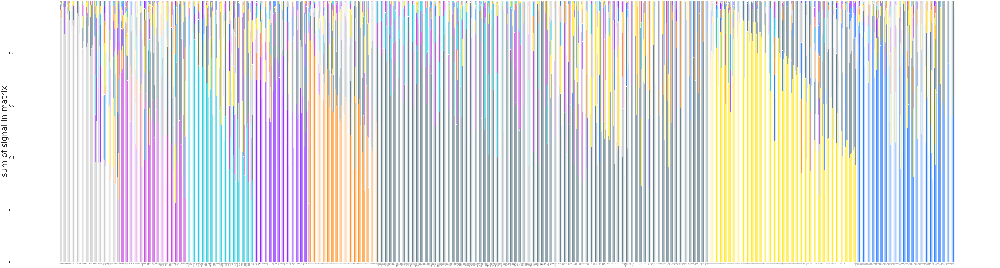

<Figure size 640x480 with 0 Axes>

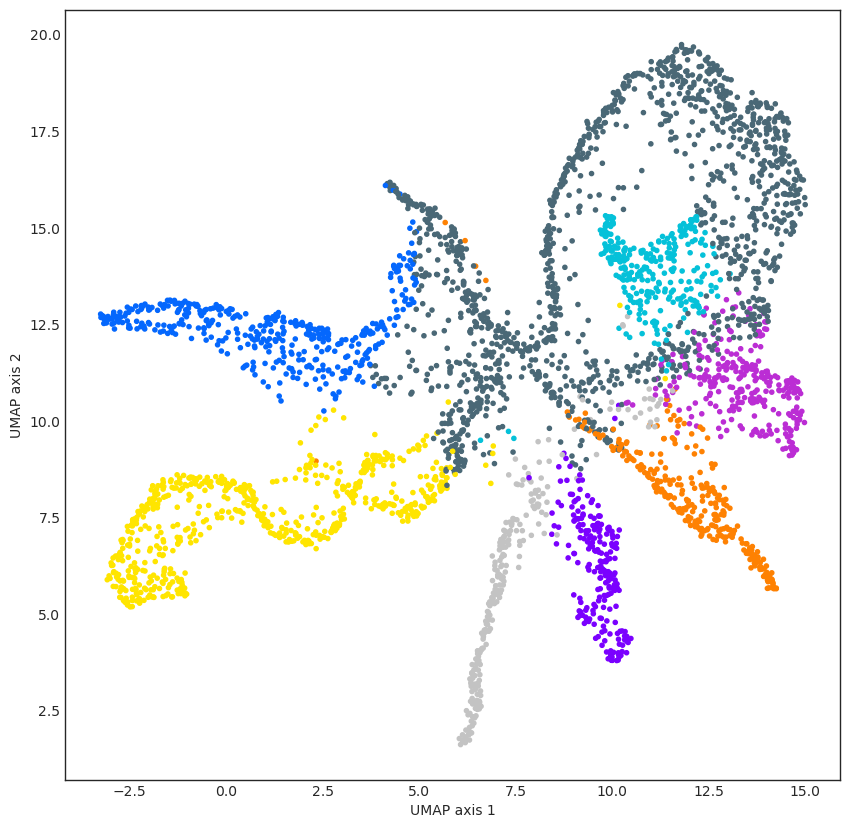

METHOD:  unweight  N_components:  16
(3780, 16) (16, 4230461) matrixes loaded for n_components 16


<Figure size 640x480 with 0 Axes>

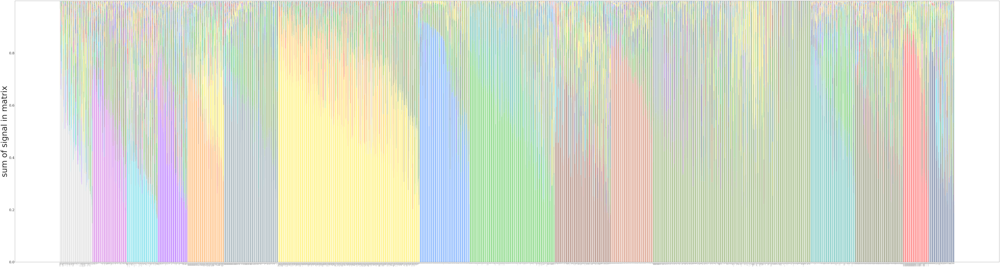

<Figure size 640x480 with 0 Axes>

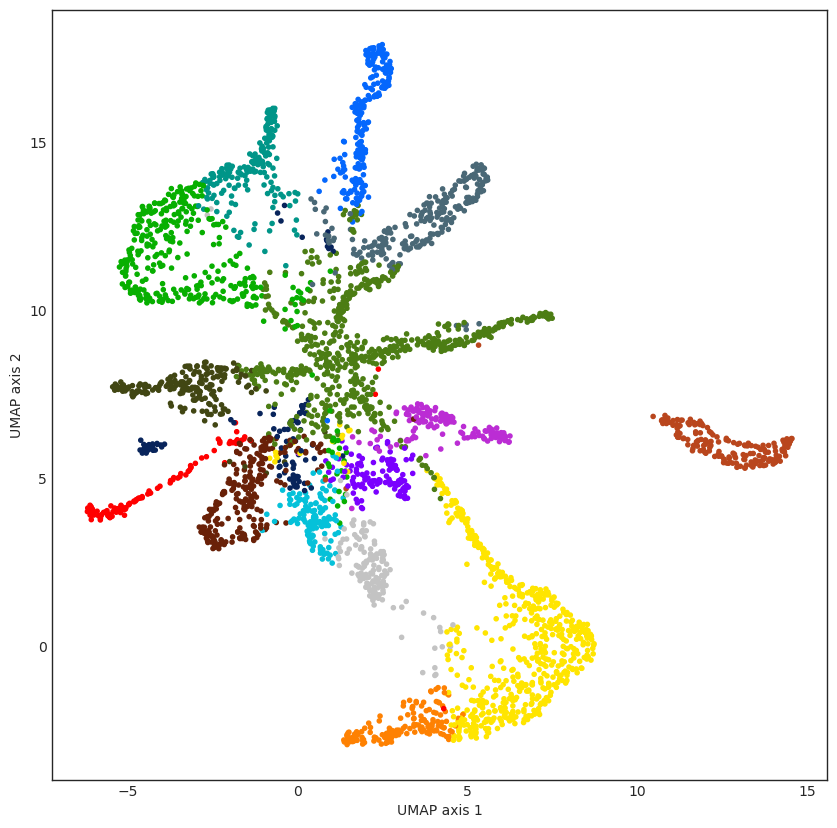

METHOD:  unweight  N_components:  24
(3780, 24) (24, 4230461) matrixes loaded for n_components 24


<Figure size 640x480 with 0 Axes>

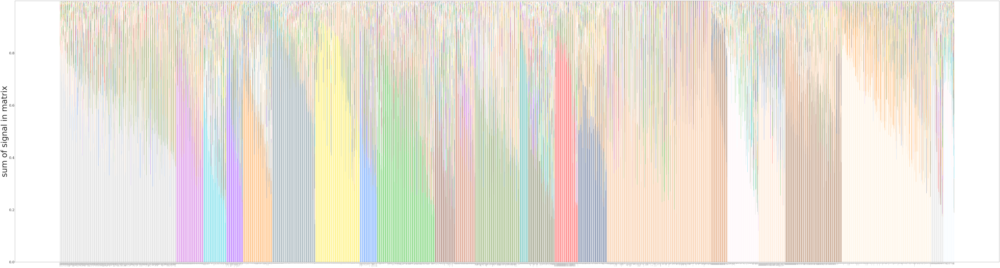

<Figure size 640x480 with 0 Axes>

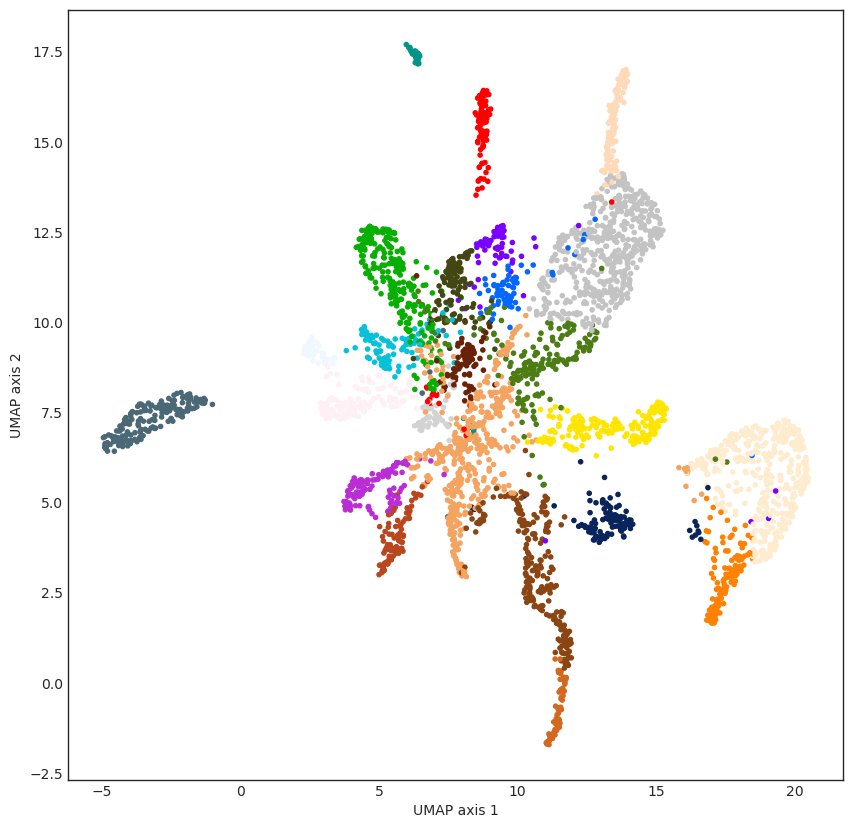

METHOD:  unweight  N_components:  36
(3780, 36) (36, 4230461) matrixes loaded for n_components 36


<Figure size 640x480 with 0 Axes>

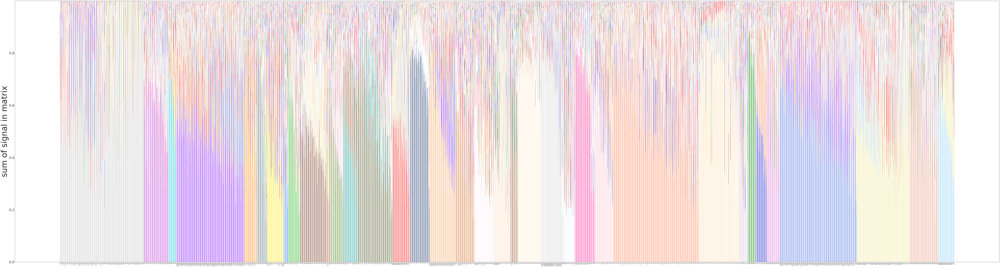

<Figure size 640x480 with 0 Axes>

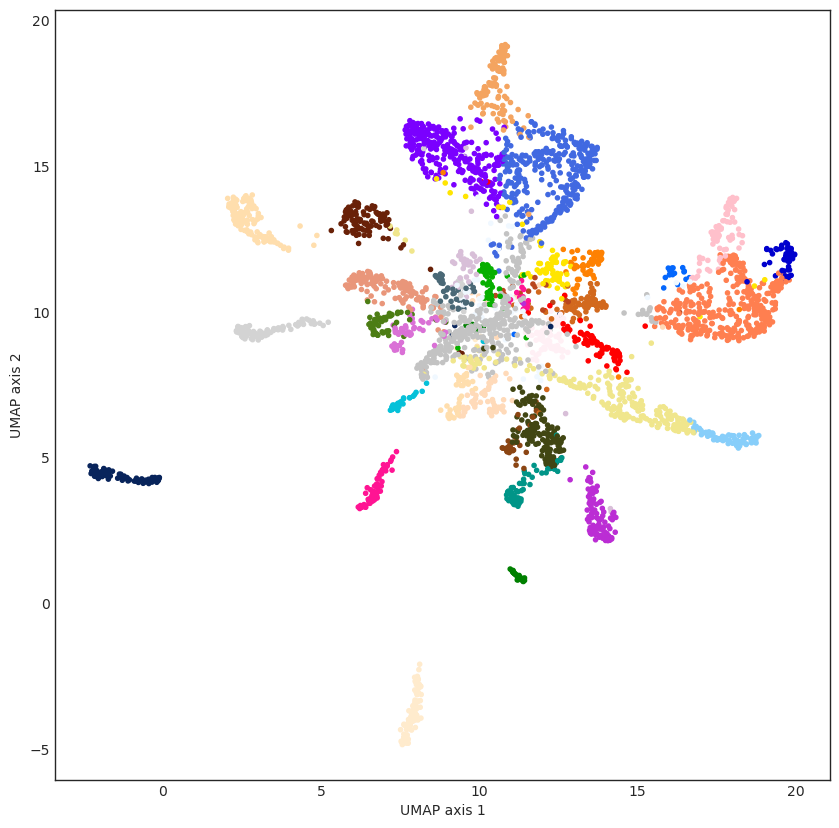

In [42]:
methods_range = ["unweight"]
#NC_ar = [4,8,10,12,16,18,20,24,28,32,36]
NC_ar = [8, 16, 24, 36]
data_slice_size = "full"

for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_new_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)
        
        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix +'.W.npy', 
                                 dir_path_pipeline + prefix +'.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        
        decomp.normalize_matrices()
        bar_graph_sort_order = get_barsortorder(decomp.Basis)
        decomp.define_colors()

        # Normolized stacked barplot
        decomp.make_stacked_bar_plot_sorted(decomp.Basis.shape[0], 
                         decomp.NormedBasis.T, 
                         dir_path_figures + prefix + '.stacked_bar_plot.normed.pdf', 
                         names=np.array(allnames), 
                         barsortorder=bar_graph_sort_order)

        # UMAP 
        majcomp = np.argmax(decomp.Basis, axis=1)
        majcomp_no1 = np.argmax(decomp.Basis[:,1:], axis=1)+1
        
        reducer = umap.UMAP(min_dist=0.5, n_neighbors=200, random_state=20)
        embedding = reducer.fit_transform(decomp.Basis)

        plt.clf()
        plt.figure(figsize=(10,10))
        decomp.define_colors()
        plt.scatter(embedding[:,0], embedding[:,1], color=np.array(decomp.Comp_colors)[majcomp], alpha=1, marker='.')
        plt.ylabel('UMAP axis 2')
        plt.xlabel('UMAP axis 1')
        plt.savefig(dir_path_figures + prefix + '.umap.pdf', )
        plt.show()

# Let's explain components

In [14]:
methods_range = ["unweight"]
#NC_ar = [4,8,10,12,16,18,20,24,28,32,36]
NC_ar = [8, 16, 24, 36]
data_slice_size = "full"

for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_new_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)
        
        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix +'.W.npy', 
                                 dir_path_pipeline + prefix +'.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        
        components_samples = [[] for _ in range(decomp.Basis.shape[1])]
        for i in range(decomp.Basis.shape[0]): #just iterate over samples to obtain "pure" samples for each component
            total = np.sum(decomp.Basis[i, :])
            major_component_idx = np.argmax(decomp.Basis[i, :])
            if decomp.Basis[i, major_component_idx] > 0.8 * total:
                components_samples[major_component_idx].append(allnames[i])
        for i, component_samples in enumerate(components_samples):
            print(f'Component {i+1}:', component_samples)


METHOD:  unweight  N_components:  8
(3780, 8) (8, 4230461) matrixes loaded for n_components 8
Component 1: ['T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'T-47D', 'h.MCF-7', 'h.MCF-7', 'T-47D', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h

(3780, 16) (16, 4230461) matrixes loaded for n_components 16
Component 1: ['h.H9.chondrocyte', 'h.PGP1.astrocytes', 'h.intestine.small.terminal.ileum', 'h.spleen', 'h.fat.pad.mesenteric', 'h.skin', 'h.skin(Sun Exposed)', 'h.brain.cortex.midfrontal', 'h.nerve.tibial', 'h.esophagus.muscularis']
Component 2: []
Component 3: []
Component 4: []
Component 5: []
Component 6: []
Component 7: ['h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.corte

(3780, 24) (24, 4230461) matrixes loaded for n_components 24
Component 1: ['h.brain.amygdala', 'h.brain.amygdala', 'h.brain.amygdala', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.anterior.cingulate.cortex', 'h.brain.hippocampus', 'h.brain.hippocampus', 'h.brain.hippocampus']
Component 2: ['h.NCI-H2081', 'h.NCI-H524', 'h.NCI-H2081', 'h.NCI-H69', 'h.NCI-H69', 'h.NCI-H1417']
Component 3: []
Component 4: ['h.H9.chondrocyte', 'h.vena.cava.posterior', 'h.spleen']
Component 5: []
Component 6: ['T-47D', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7', 'h.MCF-7'

Based on "pure" components samples -- 80% treshold

8 component:
    Component 1: 'Breast_Cancer_Cell_Lines'
    Component 2: 'Empty_Component'
    Component 3: 'Mixed_Tissues'
    Component 4: 'Mixed_Tissues'
    Component 5: 'Lung_Cancer_Cell_Lines'
    Component 6: 'Brain_Cells'
    Component 7: 'Immune_Cells'
    Component 8: 'Mixed Immune and Leukemia Cells'
    
    
16 components:
    Component 1: 'Mixed_Tissues'
    Component 2: []
    Component 3: []
    Component 4: []
    Component 5: []
    Component 6: []
    Component 7: "Various Brain Regions"
    Component 8: "K562 Leukemia Cells"
    Component 9: 'T cells'
    Component 10: 'Lung Cells'
    Component 11: MCF-7 -- breast cancer cells
    Component 12: mostly cancer?
    Component 13: 'T cells'
    Component 14: []
    Component 15: 'brain tissues'
    Component 16: 'lung cancer'

METHOD:  unweight  N_components:  16
(3780, 16) (16, 4230461) matrixes loaded for n_components 16
METHOD:  unweight  N_components:  24
(3780, 24) (24, 4230461) matrixes loaded for n_components 24
METHOD:    N_components:  16


FileNotFoundError: [Errno 2] No such file or directory: '/net/seq/data2/projects/aabisheva/Encode/nextflow_results/nmf_results/bin_new__full.16.W.npy'

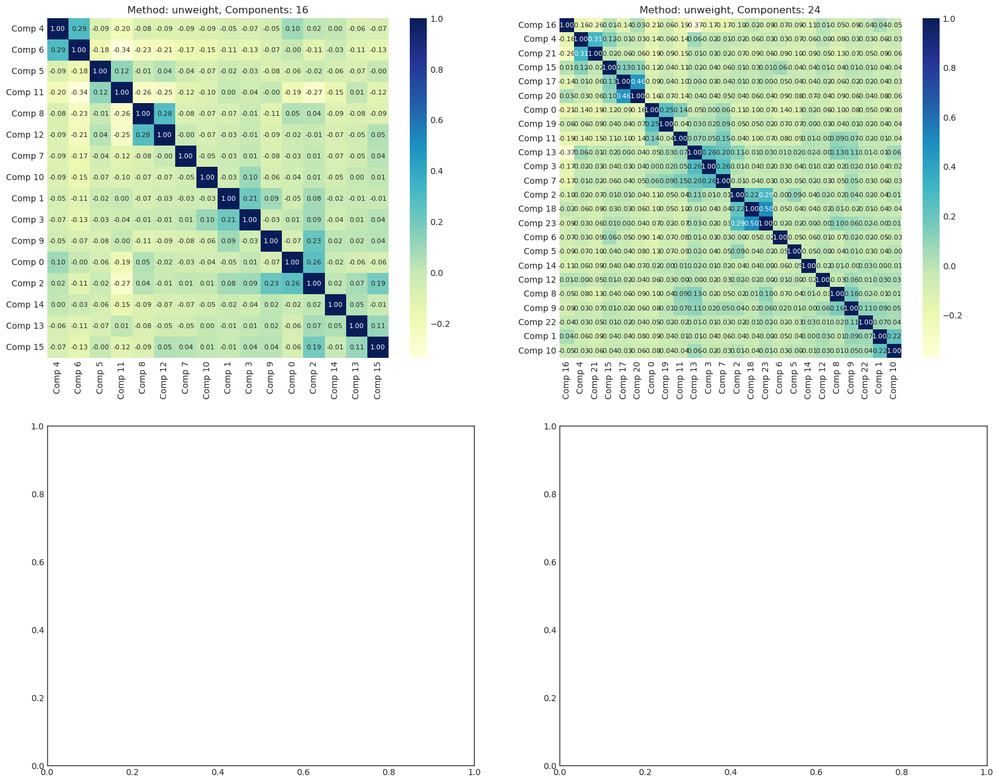

In [17]:
from scipy.cluster.hierarchy import linkage, leaves_list

methods_range = ["unweight",""]
NC_ar = [16, 24]

fig, axs = plt.subplots(len(methods_range), len(NC_ar), figsize=(20, 16))  # adjust as needed

for i, method in enumerate(methods_range):
    for j, n_components in enumerate(NC_ar):
        print("METHOD: ", method, " N_components: ", n_components)

        prefix = "bin_new_" + method + "_" + str(data_slice_size) + '.' + str(n_components)

        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix + '.W.npy',
                                 dir_path_pipeline + prefix + '.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)

        # Compute Pearson correlation coefficient for each pair of components
        pearson_corr = np.zeros((n_components, n_components))
        for k in range(n_components):
            for l in range(n_components):
                pearson_corr[k, l], _ = pearsonr(decomp.Basis[:, k], decomp.Basis[:, l])

        # Create a dataframe for a cleaner plot
        pearson_corr_df = pd.DataFrame(pearson_corr, columns=[f'Comp {k}' for k in range(n_components)],
                                       index=[f'Comp {l}' for l in range(n_components)])

        # Compute hierarchical clustering via the linkage function
        link = linkage(pearson_corr_df, method='average')
        
        # Reorder the correlation matrix DataFrame according to clustering
        idx = leaves_list(link)
        pearson_corr_df = pearson_corr_df.iloc[idx, :].T.iloc[idx, :]
        
        # Plot correlation matrix as a heatmap
        sns.heatmap(pearson_corr_df, cmap="YlGnBu", annot=True, fmt=".2f", annot_kws={"size": 8}, ax=axs[i, j])
        axs[i, j].set_title(f"Method: {method}, Components: {n_components}")

        # Save the plot
        #plt.savefig(dir_path_figures + prefix +'.component_heatmap.pearson.pdf', bbox_inches='tight')

plt.tight_layout()
plt.show()

# DHS analysis

METHOD:  unweight  N_components:  16
(3780, 16) (16, 4230461) matrixes loaded for n_components 16
(10000, 16) (16, 3780) matrixes loaded for n_components 16


<Figure size 640x480 with 0 Axes>

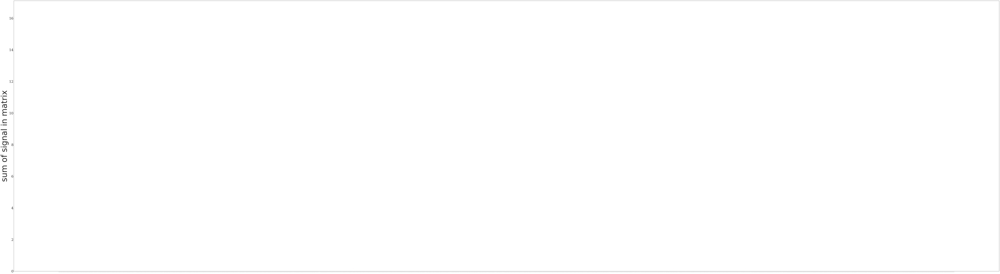

<Figure size 640x480 with 0 Axes>

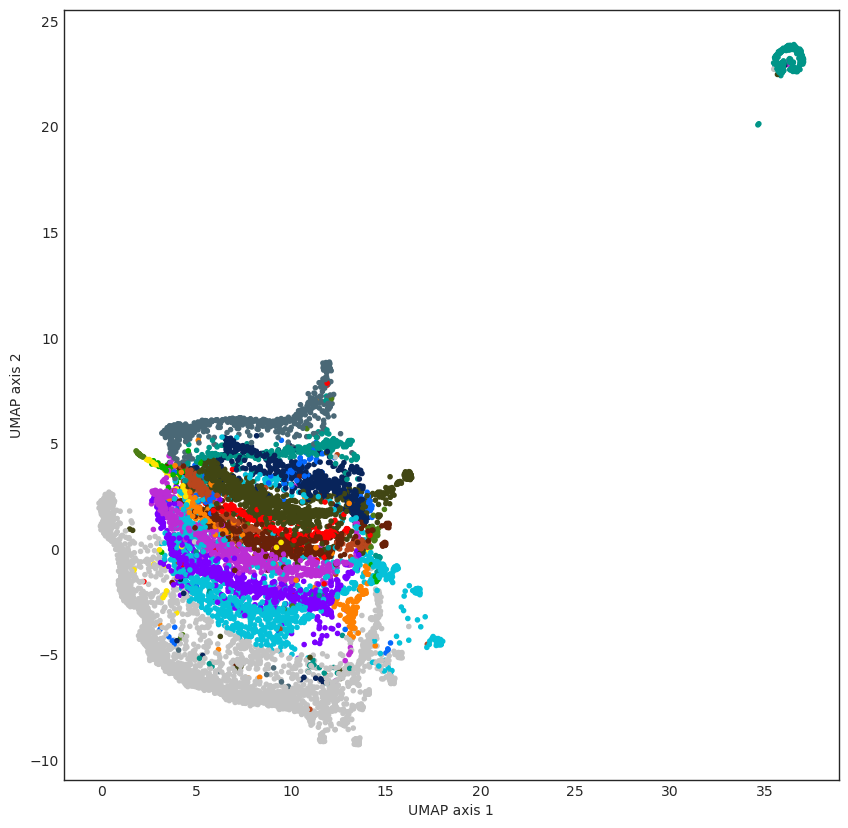

METHOD:  unweight  N_components:  24
(3780, 24) (24, 4230461) matrixes loaded for n_components 24
(10000, 24) (24, 3780) matrixes loaded for n_components 24


<Figure size 640x480 with 0 Axes>

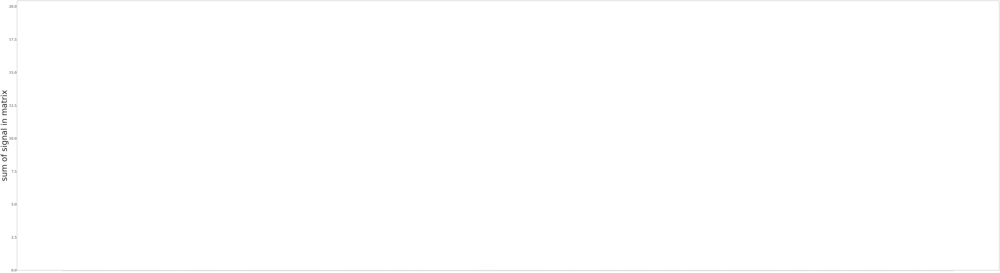

<Figure size 640x480 with 0 Axes>

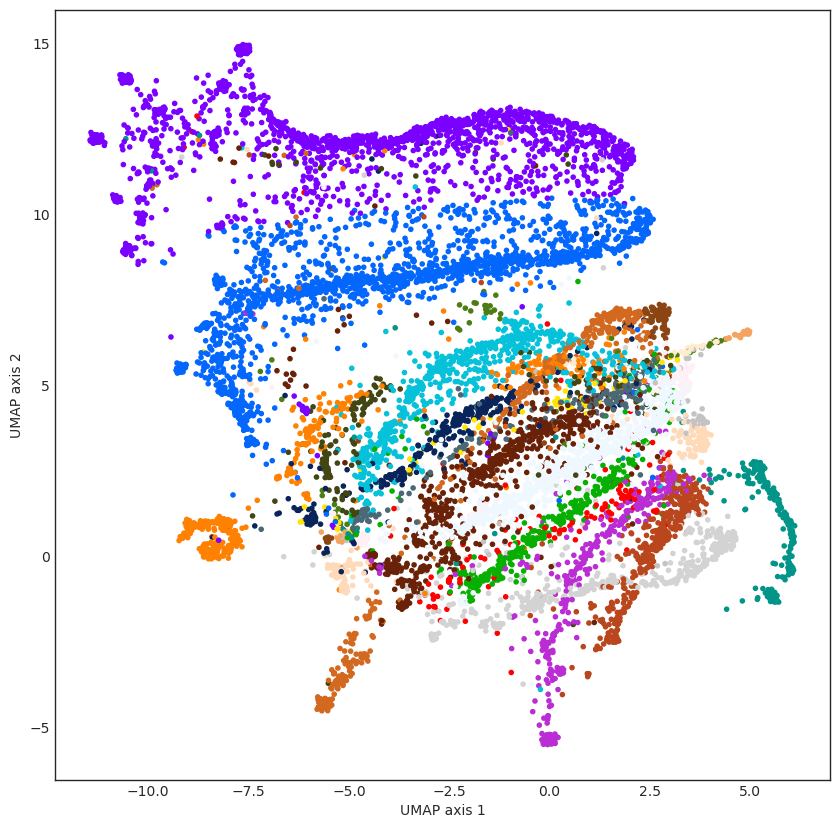

In [45]:
methods_range = ["unweight"]
NC_ar = [16, 24]
sample_size = 10000

for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_new_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)
        
        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix +'.W.npy', 
                                 dir_path_pipeline + prefix +'.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        
        decomp.normalize_matrices()
        bar_graph_sort_order = get_barsortorder(decomp.Basis)
        decomp.define_colors()
        
        seed_value = 56
        np.random.seed(seed_value)
        
        # Random sampling
        num_columns = decomp.Mixture.shape[1]
        random_indices = np.random.choice(num_columns, sample_size, replace=False)
        random_sample = decomp.Mixture[:, random_indices]
        
        # HERE SHENANIGANS STARTS!
        # In general the random_sample is OONMF object with a DHS-by-components matrix as a Basis matrix
        np.save(dir_path_pipeline + prefix +'.H.random.npy', random_sample.T)
        random_sample = OONMF.NMFobject(n_components)
        random_sample.matrix_input_name(dir_path_pipeline + prefix +'.H.random.npy',
                                        dir_path_pipeline + prefix +'.W.npy')
        random_sample.read_matrix_input(compressed=False)
        random_sample.Mixture = random_sample.Mixture.T
        print(random_sample.Basis.shape, random_sample.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        random_sample.normalize_matrices()
        bar_graph_sort_order = get_barsortorder(random_sample.Basis)
        random_sample.define_colors()
        '''   
        # heatmap
        decomp.make_standard_heatmap_plot(random_sample.Basis.shape[0], 
                                  random_sample.Basis, 
                                  dir_path_figures + prefix +'.DHS.heatmap.pdf', 
                                  #names=np.array(allnames), 
                                  barsortorder= bar_graph_sort_order)
        # Stacked barplot
        decomp.make_stacked_bar_plot_sorted(random_sample.Basis.shape[0], 
                         random_sample.Basis.T, 
                         dir_path_figures + prefix+'.DHS.stacked_bar_plot.pdf', 
                         #names=np.array(allnames), 
                         barsortorder=bar_graph_sort_order)
        '''
      

        decomp = random_sample
        
        majcomp = np.argmax(decomp.Basis, axis=1)
        majcomp_no1 = np.argmax(decomp.Basis[:,1:], axis=1)+1
        
        reducer = umap.UMAP(min_dist=0.5, n_neighbors=200, random_state=20)
        embedding = reducer.fit_transform(decomp.Basis)

        plt.clf()
        plt.figure(figsize=(10,10))
        decomp.define_colors()
        plt.scatter(embedding[:,0], embedding[:,1], color=np.array(decomp.Comp_colors)[majcomp], alpha=1, marker='.')
        plt.ylabel('UMAP axis 2')
        plt.xlabel('UMAP axis 1')
        plt.savefig(dir_path_figures + prefix + '.DHS.umap.pdf', )
        plt.show()
        
        

METHOD:  unweight  N_components:  16
(3780, 16) (16, 4230461) matrixes loaded for n_components 16
Time to find major components:  0.16727781295776367
Time to count major components:  0.009196996688842773


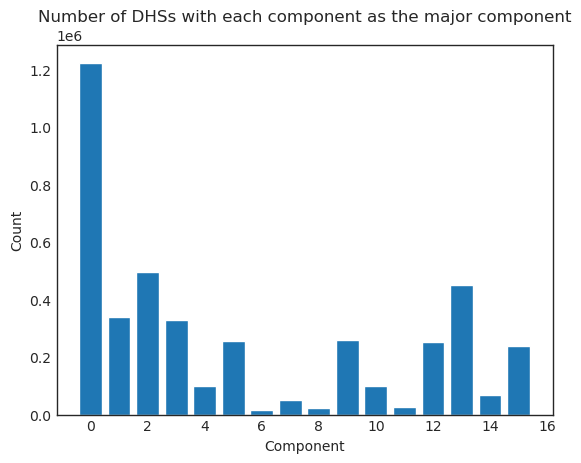

Time to find major components over 80 percent:  0.5357084274291992
Time to count major components over 80 percent:  0.0034797191619873047
Time taken for calculation of major components and their values:  0.5784077644348145
Time taken for calculation of total sum:  0.08985018730163574
Time taken for calculation of total component counts:  0.009208917617797852
Time taken for calculation of major components over 80%:  0.0608518123626709
Time taken for calculation of major components over 70%:  0.06718897819519043
Time taken for calculation of major components over 60%:  0.06138753890991211
Time taken for calculation of major components over 50%:  0.05208015441894531
Time taken for calculation of major components over 30%:  0.05069899559020996
Time taken for calculation of major components over 25%:  0.02906656265258789
Time taken for calculation of major components over 20%:  0.0478518009185791
Time taken for calculation of major components over 15%:  0.02891826629638672
Time taken for ca

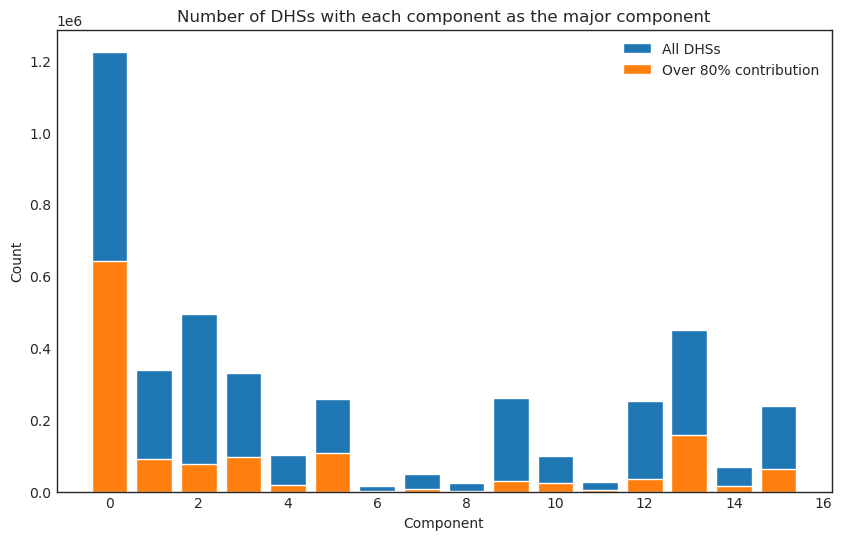

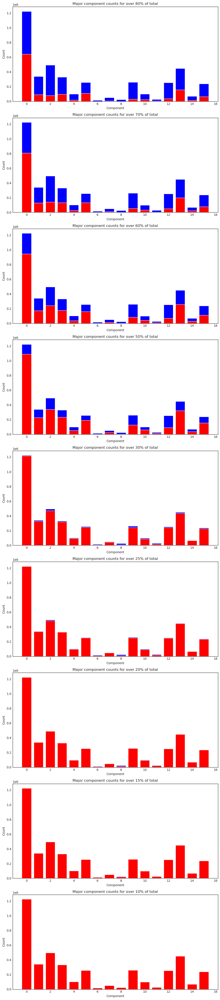

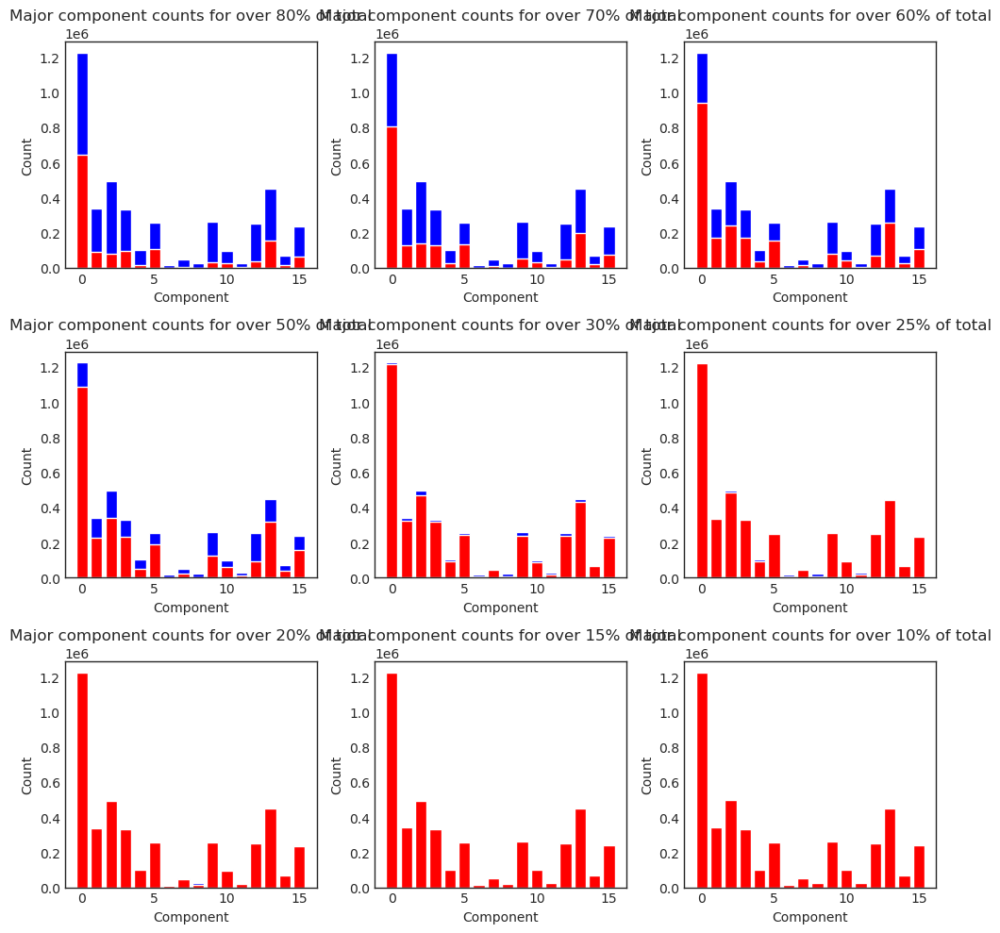

In [44]:
methods_range = ["unweight"]
NC_ar = [16]#, 24]


for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_new_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)
        
        # Data loading
        decomp = OONMF.NMFobject(n_components)
        decomp.matrix_input_name(dir_path_pipeline + prefix +'.W.npy', 
                                 dir_path_pipeline + prefix +'.H.npy')
        decomp.read_matrix_input(compressed=False)
        print(decomp.Basis.shape, decomp.Mixture.shape, "matrixes loaded for n_components", n_components)
        
        
        start_time = time.time()
        major_components = np.argmax(decomp.Mixture, axis=0)
        print("Time to find major components: ", time.time() - start_time)

        start_time = time.time()
        component_counts = np.bincount(major_components) # Count how many DHSs have each component as their major component
        print("Time to count major components: ", time.time() - start_time)

        plt.bar(range(len(component_counts)), component_counts)
        plt.xlabel('Component')
        plt.ylabel('Count')
        plt.title('Number of DHSs with each component as the major component')
        plt.savefig(dir_path_figures + prefix + 'dhs_major_components.png')
        plt.show()
        
        # Count how many DHSs have each component as their major component with more than 80% contribution
        start_time = time.time()
        major_component_values = np.max(decomp.Mixture, axis=0)
        over_80_percent = major_component_values > 0.8 * np.sum(decomp.Mixture, axis=0)
        major_components_over_80_percent = major_components[over_80_percent]
        end_time = time.time()
        print("Time to find major components over 80 percent: ", end_time - start_time)
        start_time = time.time()
        component_counts_over_80_percent = np.bincount(major_components_over_80_percent)
        end_time = time.time()
        print("Time to count major components over 80 percent: ", end_time - start_time)

        plt.figure(figsize=(10, 6))
        plt.bar(range(len(component_counts)), component_counts, label='All DHSs')
        plt.bar(range(len(component_counts_over_80_percent)), component_counts_over_80_percent, label='Over 80% contribution')
        plt.xlabel('Component')
        plt.ylabel('Count')
        plt.title('Number of DHSs with each component as the major component')
        plt.legend()
        plt.savefig(dir_path_figures + prefix + 'dhs_major_components_with_over_80_percent.png')

        # These are the percentages you're interested in
        percentages = [80, 70, 60, 50, 30, 25, 20, 15, 10]

        # Initialize a figure and axes for subplots
        fig, axs = plt.subplots(len(percentages), 1, figsize=(10, 5*len(percentages)))

        # Calculate the major components and their values
        start_time = time.time()
        major_components = np.argmax(decomp.Mixture, axis=0)
        major_component_values = np.max(decomp.Mixture, axis=0)
        print("Time taken for calculation of major components and their values: ", time.time() - start_time)

        # Total sum of components for each DHS
        start_time = time.time()
        total_sum = np.sum(decomp.Mixture, axis=0)
        print("Time taken for calculation of total sum: ", time.time() - start_time)

        # Counts of each major component
        start_time = time.time()
        total_component_counts = np.bincount(major_components)
        print("Time taken for calculation of total component counts: ", time.time() - start_time)

        for i, percent in enumerate(percentages):
            # Calculate the boolean array for this percentage
            start_time = time.time()
            over_percent = major_component_values > (percent/100) * total_sum

            # Get the major components where the condition is met
            major_components_over_percent = major_components[over_percent]

            # Count the occurrences of each component
            over_percent_counts = np.bincount(major_components_over_percent)
            print(f"Time taken for calculation of major components over {percent}%: ", time.time() - start_time)

            # Plot the counts
            axs[i].bar(range(len(total_component_counts)), total_component_counts, color='b')
            axs[i].bar(range(len(over_percent_counts)), over_percent_counts, color='r')
            axs[i].set_title(f'Major component counts for over {percent}% of total')
            axs[i].set_xlabel('Component')
            axs[i].set_ylabel('Count')
        # Adjust the layout
        plt.tight_layout()

        # Save the figure
        plt.savefig(dir_path_figures + prefix + "major_components_for different percentages.png")
        
        # These are the percentages you're interested in
        percentages = [80, 70, 60, 50, 30, 25, 20, 15, 10]

        # Initialize a figure and axes for subplots
        fig, axs = plt.subplots(3, 3, figsize=(10, 10))  

        # Calculate the major components and their values
        start_time = time.time()
        major_components = np.argmax(decomp.Mixture, axis=0)
        major_component_values = np.max(decomp.Mixture, axis=0)
        print("Time taken for calculation of major components and their values: ", time.time() - start_time)

        # Total sum of components for each DHS
        start_time = time.time()
        total_sum = np.sum(decomp.Mixture, axis=0)
        print("Time taken for calculation of total sum: ", time.time() - start_time)

        # Counts of each major component
        start_time = time.time()
        total_component_counts = np.bincount(major_components)
        print("Time taken for calculation of total component counts: ", time.time() - start_time)

        for i, percent in enumerate(percentages):
            # Calculate the boolean array for this percentage
            start_time = time.time()
            over_percent = major_component_values > (percent/100) * total_sum

            # Get the major components where the condition is met
            major_components_over_percent = major_components[over_percent]

            # Count the occurrences of each component
            over_percent_counts = np.bincount(major_components_over_percent)
            print(f"Time taken for calculation of major components over {percent}%: ", time.time() - start_time)

            # Plot the counts
            axs[i // 3, i % 3].bar(range(len(total_component_counts)), total_component_counts, color='b')
            axs[i // 3, i % 3].bar(range(len(over_percent_counts)), over_percent_counts, color='r')
            axs[i // 3, i % 3].set_title(f'Major component counts for over {percent}% of total')
            axs[i // 3, i % 3].set_xlabel('Component')
            axs[i // 3, i % 3].set_ylabel('Count')

        # Adjust the layout
        plt.tight_layout()
        plt.show()

        # Save the figure
        #plt.savefig("major_components_counts.png")


# DHS clustering

## K-means

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

methods_range = ["unweight"]
NC_ar = [16]#, 24]

for method in methods_range:
    for n_components in NC_ar:
        print("METHOD: ", method, " N_components: ", n_components)
        
        prefix = "bin_new_" + method + "_" + str(data_slice_size)+'.'+ str(n_components)

        dhs_component_matrix = np.load(dir_path_pipeline + prefix +".H.npy")  
        
        # Normalize the data
        scaler = StandardScaler()
        dhs_component_matrix = scaler.fit_transform(dhs_component_matrix.T)  # Transpose the matrix

        # Perform clustering using K-means
        n_clusters = 16  # Specify the desired number of clusters
        kmeans = KMeans(n_clusters=n_clusters, random_state=42)
        cluster_labels = kmeans.fit_predict(dhs_component_matrix)
        
        # Perform dimensionality reduction using UMAP
        umap_reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42)
        umap_embedding = umap_reducer.fit_transform(dhs_component_matrix)

        # Visualize the clustering results
        plt.figure(figsize=(8, 6))
        plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=cluster_labels, cmap='viridis')
        plt.title('UMAP Visualization of Clustering Results')
        plt.xlabel('UMAP Dimension 1')
        plt.ylabel('UMAP Dimension 2')
        plt.colorbar(label='Cluster')
        plt.show()


METHOD:  unweight  N_components:  16


# DHS annotation

In [18]:
dhs_bed_file = '/net/seq/data2/projects/sabramov/SuperIndex/dnase-0520/output/masterlist.filtered.bed'
dhs_regions = pd.read_csv(dhs_bed_file, sep='\t')
dhs_regions

,#chr,start,end,chunk_id,score,n_samples,n_peaks,dhs_width,summit,start_core,end_core
0,chr1,10037,10200,chunk0001_1_1,316.758963,404,404,163,10110,10090.0,10130.0
1,chr1,10429,10640,chunk0001_3_2,283.994075,508,523,211,10530,10370.0,10570.0
2,chr1,13260,13381,chunk0001_4_2,10.023706,59,59,121,13330,13310.0,13330.0
3,chr1,13905,14041,chunk0001_5_1,0.803243,6,6,136,13970,13970.0,13970.0
4,chr1,15180,15320,chunk0001_6_1,0.912923,9,9,140,15230,15230.0,15246.0
...,...,...,...,...,...,...,...,...,...,...,...
4230456,chr9,138218481,138218616,chunk2170_133_1,2.270939,17,17,135,138218550,138218530.0,138218562.0
4230457,chr9,138219421,138219540,chunk2170_134_3,41.470610,132,132,119,138219470,138219330.0,138219530.0
4230458,chr9,138220520,138220720,chunk2170_135_1,3.900414,33,33,200,138220610,138220566.0,138220698.0
4230459,chr9,138220781,138220960,chunk2170_138_2,13.870757,52,52,179,138220870,138220816.0,138220890.0


In [25]:
dhs_annotation_file = '/net/seq/data2/projects/ENCODE4Plus/indexes/index_altius_23-05-11/dhs_metadata/output/masterlist_DHSs_dnase-05-11_all_chunkIDs_annotated.txt'
dhs_annotation = pd.read_csv(dhs_annotation_file, sep='\t')
dhs_annotation = dhs_annotation.rename(columns={"seqname": "#chr"})
dhs_annotation

,#chr,start,end,dhs_id,total_signal,num_samples,num_peaks,dhs_width,dhs_summit,core_start,...,exon_subgroup,is_coding,dist_tss,gene_name,repeat_class,repeat_family,repeat_name,is_encode3,encode3_ovr-fraction,num_gwasCatalog_variants
0,chr1,10037,10200,chunk0001_1_1,316.758963,404,404,163,10110,10090.0,...,NaN,NPC,1670,DDX11L1,NaN,NaN,NaN,0,0.000000,0
1,chr1,10297,10527,chunk0001_3_1,100.025318,170,170,230,10410,10314.0,...,NaN,NPC,1343,DDX11L1,NaN,NaN,NaN,0,0.000000,0
2,chr1,10464,10640,chunk0001_3_2,186.394903,352,352,176,10550,10466.0,...,NaN,NPC,1230,DDX11L1,NaN,NaN,NaN,0,0.000000,0
3,chr1,13260,13381,chunk0001_4_2,10.023706,59,59,121,13330,13310.0,...,NaN,NPC,-1250,DDX11L1,NaN,NaN,NaN,0,0.000000,0
4,chr1,13905,14041,chunk0001_5_1,0.803243,6,6,136,13970,13970.0,...,NaN,NPC,-1895,DDX11L1,NaN,NaN,NaN,0,0.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4673250,chrY,26586760,26586900,chunk2409_25_1,0.884144,7,7,140,26586830,26586830.0,...,NaN,NPC,4701,SLC25A15P1,NaN,NaN,NaN,0,0.000000,0
4673251,chrY,26590017,26590180,chunk2409_29_1,3.204600,9,9,163,26590090,26590070.0,...,NaN,NPC,1421,SLC25A15P1,NaN,NaN,NaN,1,0.858896,0
4673252,chrY,26593887,26594007,chunk2409_34_1,0.171570,2,2,120,26593940,26593930.0,...,NaN,NPC,-2287,SLC25A15P1,NaN,NaN,NaN,0,0.000000,0
4673253,chrY,26613420,26613600,chunk2409_39_1,0.611615,3,3,180,26613510,26613510.0,...,NaN,NPC,13559,CCNQP2,SINE,MIR,MIRb,0,0.000000,0


In [26]:
merged_df = pd.merge(dhs_regions, dhs_annotation, how='inner', on=["#chr", "start", "end"])
merged_df

,#chr,start,end,chunk_id,score,n_samples,n_peaks,dhs_width_x,summit,start_core,...,exon_subgroup,is_coding,dist_tss,gene_name,repeat_class,repeat_family,repeat_name,is_encode3,encode3_ovr-fraction,num_gwasCatalog_variants
0,chr1,10037,10200,chunk0001_1_1,316.758963,404,404,163,10110,10090.0,...,NaN,NPC,1670,DDX11L1,NaN,NaN,NaN,0,0.000000,0
1,chr1,13260,13381,chunk0001_4_2,10.023706,59,59,121,13330,13310.0,...,NaN,NPC,-1250,DDX11L1,NaN,NaN,NaN,0,0.000000,0
2,chr1,13905,14041,chunk0001_5_1,0.803243,6,6,136,13970,13970.0,...,NaN,NPC,-1895,DDX11L1,NaN,NaN,NaN,0,0.000000,0
3,chr1,15180,15320,chunk0001_6_1,0.912923,9,9,140,15230,15230.0,...,NaN,NPC,2116,MIR6859-1,SINE,MIR,MIR3,0,0.000000,0
4,chr1,16160,16320,chunk0001_10_2,123.549102,388,390,160,16230,16150.0,...,NaN,NPC,1116,MIR6859-1,NaN,NaN,NaN,1,0.250000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2283842,chr9,138217452,138217684,chunk2170_129_1,48.897053,149,150,232,138217550,138217490.0,...,NaN,NPC,-384,FAM157B,NaN,NaN,NaN,1,0.879310,0
2283843,chr9,138217745,138217911,chunk2170_130_1,1.290220,8,8,166,138217830,138217738.0,...,NaN,NPC,-677,FAM157B,NaN,NaN,NaN,1,0.349398,0
2283844,chr9,138218481,138218616,chunk2170_133_1,2.270939,17,17,135,138218550,138218530.0,...,NaN,NPC,-1413,FAM157B,NaN,NaN,NaN,0,0.000000,0
2283845,chr9,138220520,138220720,chunk2170_135_1,3.900414,33,33,200,138220610,138220566.0,...,NaN,NPC,-3452,FAM157B,NaN,NaN,NaN,1,1.000000,0
